<a href="https://colab.research.google.com/github/semakalyon/Deep-Learning---Machine-Learning/blob/main/people_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

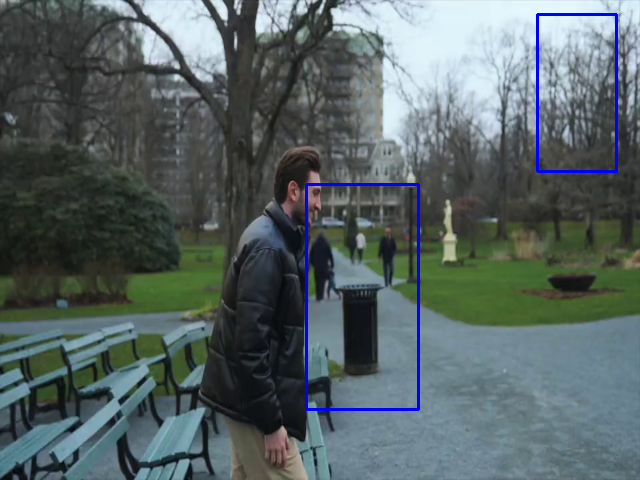

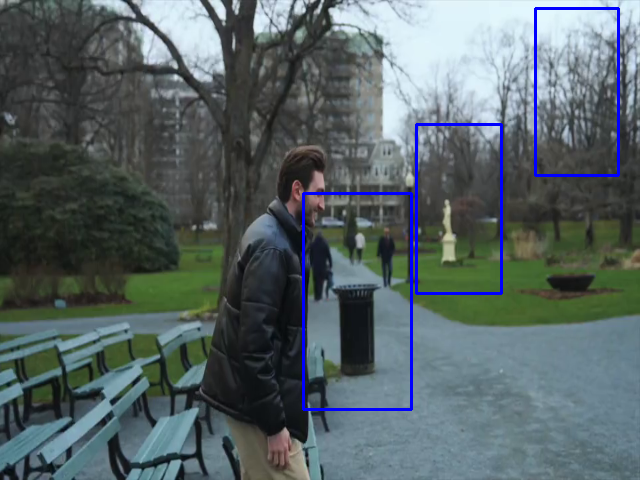

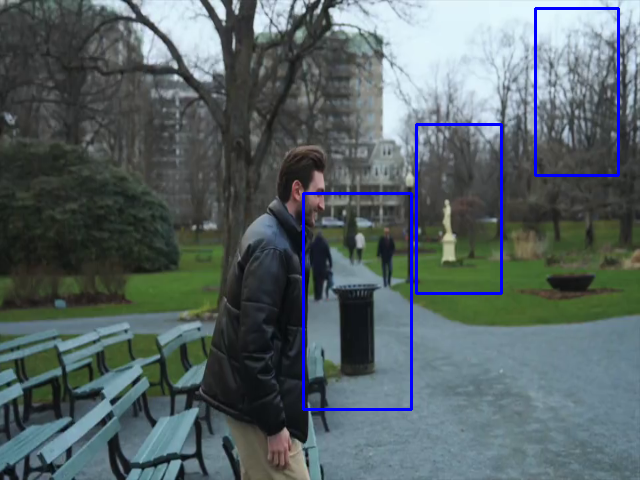

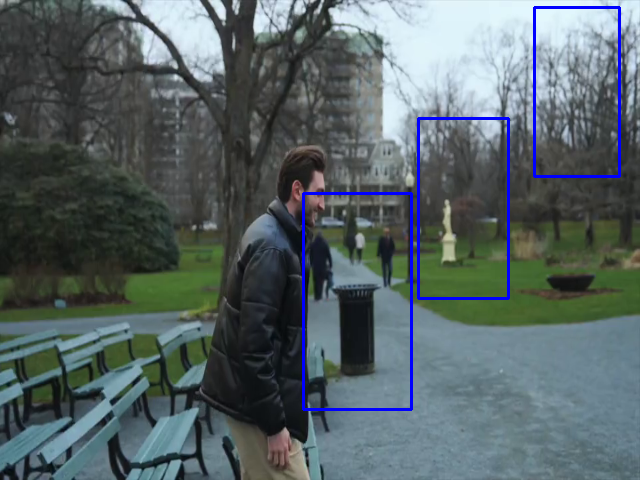

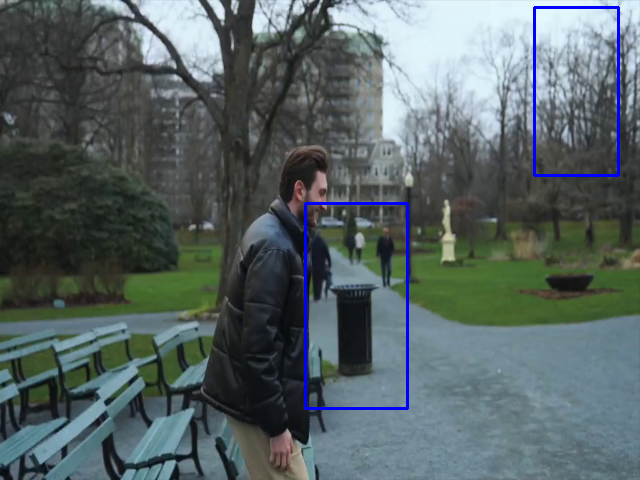

...

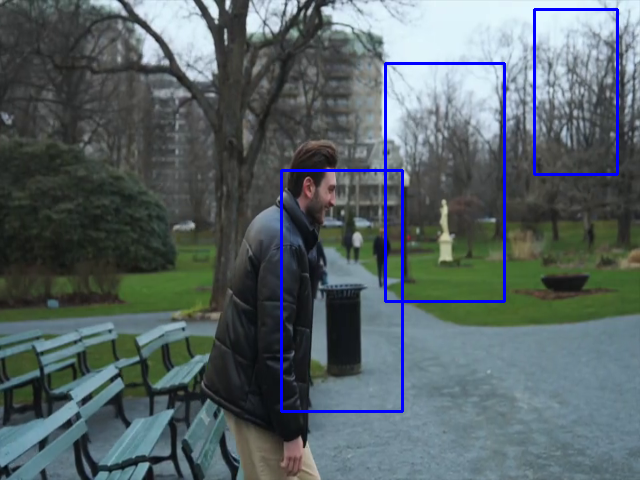

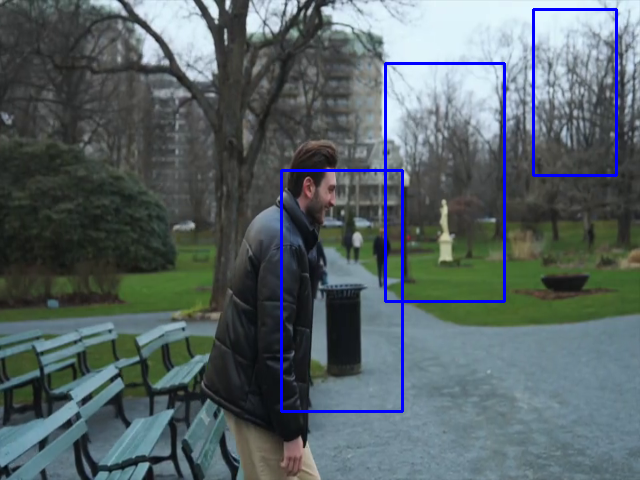

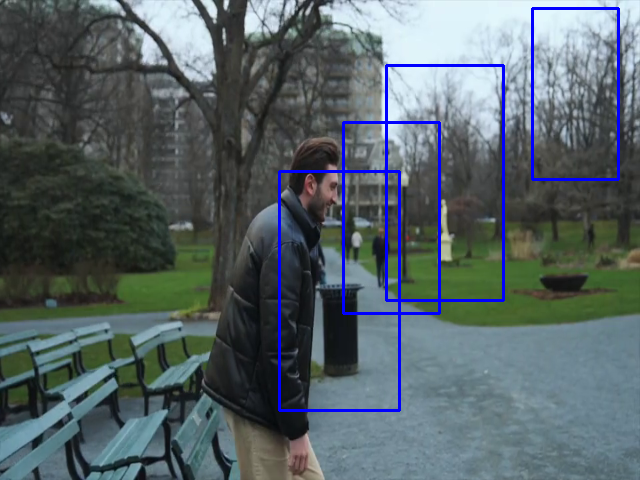

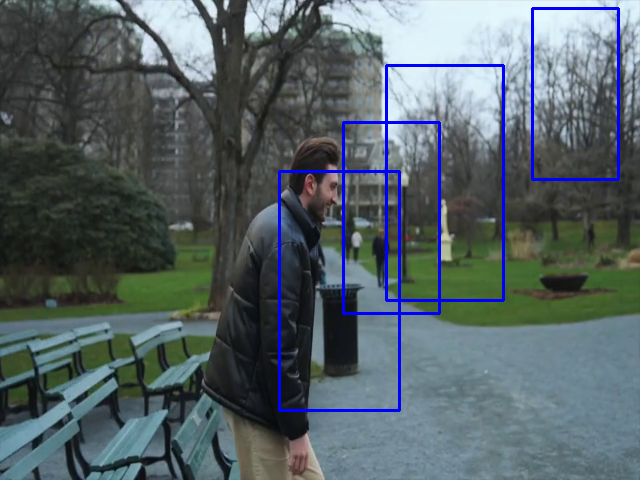

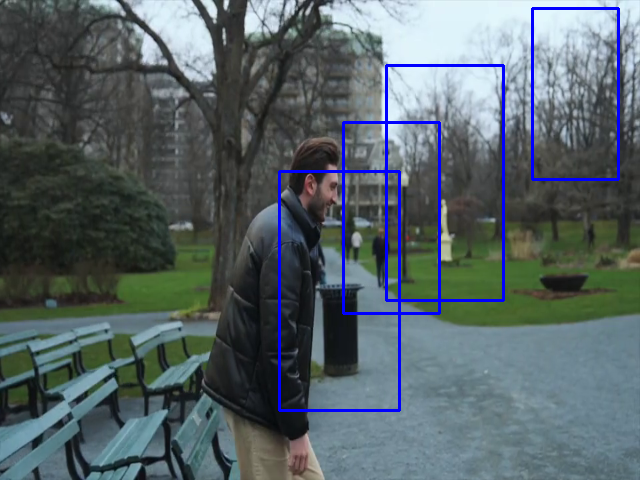

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Initialize HOG descriptor and set the SVM detector for car detection
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())  # Example for pedestrians

# Open video capture
video_path = '/212511_small.mp4'
cap = cv2.VideoCapture(video_path)  # Use 0 for webcam

if not cap.isOpened():
    print(f"Error opening video file {video_path}")
    exit(1)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Resize the frame for faster processing (optional)
    frame_resized = cv2.resize(frame, (640, 480))

    # Detect cars (or pedestrians in this example)
    (rects, weights) = hog.detectMultiScale(frame_resized, winStride=(4, 4), padding=(8, 8), scale=1.05)

    # Draw rectangles around the detected cars
    for (x, y, w, h) in rects:
        cv2.rectangle(frame_resized, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Display the resulting frame
    cv2_imshow(frame_resized)

    # Break the loop on 'q' key press
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the capture and close windows
cap.release()
cv2.destroyAllWindows()